In [1]:
import os
import numpy as np
import struct as st 
import pandas as pd
import plotly.offline as py
import plotly.graph_objs as go
py.offline.init_notebook_mode(connected=True)
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
phsp_file='/media/sf_jeremy/Documents/Phd/work/CRCT/temp/foc/phsp/6FFF/0-6FFF_mlc_1x1.IAEAphsp'
#phsp_file='/media/sf_jeremy/Documents/Phd/work/CRCT/temp/foc/phsp/tony/6X/1J3/0-6X_1j3.IAEAphsp'
file_size=os.path.getsize(phsp_file)

FileNotFoundError: [Errno 2] No such file or directory: '/media/sf_jeremy/Documents/Phd/work/CRCT/temp/foc/phsp/6FFF/0-6FFF_mlc_1x1.IAEAphsp'

In [149]:
# Define phsp type 
# N : native from Varian (photon, electron)
# R : Reduced (photon, electron)

phsp_type = 'R'  

if phsp_type == 'N':
    dt=np.dtype([('p', np.int8), ('e', np.float32), ('x', np.float32), ('y', np.float32), ('dx', np.float32), ('dy', np.float32)])
    part_size=21
    s_unpack='<bfffff'
    e=1; x=2; y=3; ang_x=4; ang_y=5;
    
if phsp_type == 'R':
    dt=np.dtype([('p', np.int8), ('e', np.float32), ('x', np.float32), ('y', np.float32), ('z', np.float32), ('dx', np.float32), ('dy', np.float32), ('we', np.float32), ('inc', np.float32) ])
    part_size=33
    s_unpack='<bffffffff'
    e=1; x=2; y=4; ang_x=5; ang_y=6; #y=4 car pas le même référentiel dans GATE

n_part=int(file_size/part_size)#/10#number of paricles in phsp file
n_part

4378684

# Energy spectrum

In [142]:

n_bins = 1000  #number of bins
max_energy_value = 10.0  #maximum physical value (energy, position, or direction)
bin_size = max_energy_value/n_bins # bin_size : physical value of one bin (= physical résolution)

energy_spectrum=np.zeros(n_bins) # array of number of bins


data=open(phsp_file, 'rb')
for i in range(0, n_part-1):     # loop on each particl oh phsp file
    bit=data.read(part_size)     # buffer of byte particle size
    values=st.unpack(s_unpack, bit)
    energy_spectrum[int(abs(values[e])/bin_size)] +=1  # count each value for the corresponding bin
data.close()

In [143]:
# plot 
trace = go.Scatter(
    x=np.arange(len(energy_spectrum))*bin_size,  # convert into physical values
    y=energy_spectrum,
    mode='lines',
    fill='tozeroy',   
    line=dict(
        shape='hv'   # to have the value centered on the bin 
    )
)
data=[trace]
py.iplot(data, filename='energy spectrum')

In [17]:
phsp_file2='/media/sf_CRCT/JupyterNotebook/data/phsp/input/0-6E10x10A10_v2.IAEAphsp'
file_size2=os.path.getsize(phsp_file)
phsp_type2 = 'R'  

if phsp_type2 == 'N':
    dt=np.dtype([('p', np.int8), ('e', np.float32), ('x', np.float32), ('y', np.float32), ('dx', np.float32), ('dy', np.float32)])
    part_size2=21
    s_unpack='<bfffff'
    e=1; x=2; y=3; ang_x=4; ang_y=5;
    
if phsp_type2 == 'R':
    dt=np.dtype([('p', np.int8), ('e', np.float32), ('x', np.float32), ('y', np.float32), ('z', np.float32), ('dx', np.float32), ('dy', np.float32), ('we', np.float32), ('inc', np.float32) ])
    part_size2=33
    s_unpack='<bffffffff'
    e=1; x=2; y=4; ang_x=5; ang_y=6; #y=4 car pas le même référentiel dans GATE

n_part2=(file_size2/part_size2)#number of paricles in phsp file
n_bins = 1000  #number of bins
max_energy_value = 10.0  #maximum physical value (energy, position, or direction)
bin_size = max_energy_value/n_bins # bin_size : physical value of one bin (= physical résolution)

energy_spectrum2=np.zeros(n_bins) # array of number of bins


data=open(phsp_file2, 'rb')
for i in range(0, n_part2-1):     # loop on each particl oh phsp file
    bit=data.read(part_size2)     # buffer of byte particle size
    values=st.unpack(s_unpack, bit)
    energy_spectrum2[int(abs(values[e])/bin_size)] +=1  # count each value for the corresponding bin
data.close()


FileNotFoundError: [Errno 2] No such file or directory: '/media/sf_CRCT/JupyterNotebook/data/phsp/input/0-6E10x10A10_v2.IAEAphsp'

In [58]:
# plot 
trace1 = go.Scatter(
    x=np.arange(len(energy_spectrum))*bin_size,  # convert into physical values
    y=energy_spectrum,
    mode='lines',
    name='Reduced',
    fill='tozeroy',   
    line=dict(
        shape='hv'   # to have the value centered on the bin 
    )
)

trace2 = go.Scatter(
    x=np.arange(len(energy_spectrum2))*bin_size,  # convert into physical values
    y=energy_spectrum2,
    mode='lines',
    name='Native (Varian)',
    fill='tozeroy',   
    line=dict(
        shape='hv'   # to have the value centered on the bin 
    )
)
layout1= go.Layout(
    title='Phase Space Energy Spectrum',
    titlefont=dict(size=19),
    xaxis=dict(
        title='Energy (MeV)',
        titlefont=dict(
            size=16
        )
),      
    yaxis=dict(
        title='Number of Particle',
        titlefont=dict(
        size=16)
    ),
)
data=[trace1, trace2]
fig= go.Figure(data=data, layout=layout1)
py.iplot(fig, filename='energy spectrum', image='svg')

# Position histogram (x and y)

In [150]:
n_bins = 100000
max_position_value = 41  #maximum physical value see phsp header and use (positive position maximum * 2)
bin_size = max_position_value/n_bins # position max cm / nombre de bins
half_position_value = max_position_value / 2.0 #for shift histogram and avoid 0 bin overcounted artefact

x_pos=np.zeros(n_bins)
y_pos=np.zeros(n_bins)

data=open(phsp_file, 'rb')
for i in range(0, n_part-1):
    bit=data.read(part_size)
    values=st.unpack(s_unpack, bit)
    x_pos[int((values[x]+half_position_value)/bin_size)] +=1
data.close()

data=open(phsp_file, 'rb')
for i in range(0, n_part-1):
    bit=data.read(part_size)
    values=st.unpack(s_unpack, bit)
    y_pos[int((values[y]+half_position_value)/bin_size)] +=1
data.close()

In [151]:
tracex = go.Scatter(
    x=np.arange(len(x_pos))*bin_size-half_position_value, # convert into phsysical value and shift to real position
    y=x_pos,
    name='x position',
    fill='tozeroy',
    mode='lines',
    line=dict(
        shape='hv'
    )
)
    
tracey = go.Scatter(
    x=np.arange(len(y_pos))*bin_size-half_position_value,  # convert into phsysical value and shift to real position
    y=y_pos,
    mode='lines',
    name='y position',
    fill='tozeroy',
    line=dict(
        shape='hv'
    )
)
data=[tracex, tracey]
py.iplot(data, filename='position spectrum')

# Position particle map

In [92]:
n_bins = 10000
part_map=np.zeros([n_bins, n_bins])
bin_size = max_position_value/n_bins # taille max / nombre de bins


data=open(phsp_file, 'rb')
for i in range(0, n_part -1):
    bit=data.read(part_size)
    values=st.unpack(s_unpack, bit)
    X=int((values[x]+half_position_value)/bin_size)
    Y=int((values[y]+half_position_value)/bin_size)
    part_map[X][Y] +=1      
data.close()

Position Particle Map


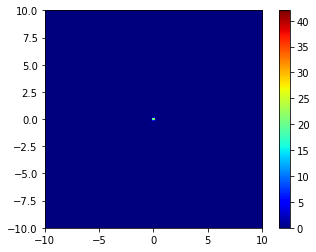

In [94]:
# plot energy particle map
print('Position Particle Map')
plt.imshow(part_map, cmap=plt.cm.jet, extent=[-10, 10, -10, 10]);
plt.colorbar();

In [55]:
data = [
        go.Surface(
            z=part_map,
            )
]
fig = go.Figure(data=data)
py.iplot(fig, filename='part_map')

Mean Enregy Particle Map


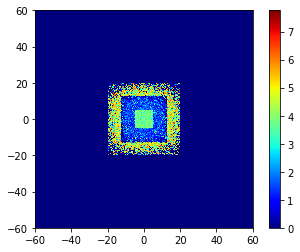

In [68]:
n_bins = 1000
energy_part_map=np.zeros((n_bins, n_bins))
bin_size = max_position_value/n_bins # taille max / nombre de bins

data=open(phsp_file, 'rb')
for i in range(0, n_part -1):
    bit=data.read(part_size)
    values=st.unpack(s_unpack, bit)
    X=int((values[x]+half_position_value)/bin_size)
    Y=int((values[y]+half_position_value)/bin_size)
    energy_part_map[X,Y] += abs(values[1])      
data.close()

part_map[part_map == 0]=1                      #where there is no particle set one to avoid energy divide by zeros
mean_energy_part_map=energy_part_map/part_map

print('Mean Enregy Particle Map')
plt.imshow(mean_energy_part_map, cmap=plt.cm.jet, extent=[-60, 60, -60, 60]);
plt.colorbar();

In [59]:
data = [
        go.Surface(
            z=mean_energy_part_map,
            )
]
layout2= go.Layout(
    title='2D Histogram of Mean Energy',
    titlefont=dict(size=19),
    xaxis=dict(
        title='postion (mm)',
        titlefont=dict(
            size=16
        )
),      
    yaxis=dict(
        title='position (mm)',
        titlefont=dict(
        size=16)
    ),
 )
fig2 = go.Figure(data=data ,layout=layout2)
py.iplot(fig2, filename='mean_energy_part_map')

In [31]:
n_bins = 1000
max_angle_value = 2.0  #maximum physical value see phsp header and use (positive position maximum * 2)
bin_size = max_angle_value/n_bins # energy max MeV / nombre de bins
half_angle_value = max_angle_value / 2.0 #for shift histogram and avoid 0 bin overcounted artefact

dx=np.zeros(n_bins)
dy=np.zeros(n_bins)

data=open(phsp_file, 'rb')
for i in range(0, n_part-1):
    bit=data.read(part_size)
    values=st.unpack(s_unpack, bit)
    dx[int((values[ang_x]+half_angle_value)/bin_size)] +=1
data.close()

data=open(phsp_file, 'rb')
for i in range(0, n_part-1):
    bit=data.read(part_size)
    values=st.unpack(s_unpack, bit)
    dy[int((values[ang_y]+half_angle_value)/bin_size)] +=1
data.close()

In [ ]:
tracex = go.Scatter(
    x=np.arange(len(dx))*bin_size-half_angle_value, # convert into phsysical value and shift to real position
    y=dx,
    fill='tozeroy',
    mode='lines',
    line=dict(
        shape='hv'
    )
)
    
tracey = go.Scatter(
    x=np.arange(len(dy))*bin_size-half_angle_value,  # convert into phsysical value and shift to real position
    y=dy,
    mode='lines',
    fill='tozeroy',
    line=dict( 
        shape='hv'
    )
)
data=[tracex, tracey]
py.iplot(data, filename='agnle spectrum')